In [13]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import wilcoxon
from matplotlib import patches as mpatches
from matplotlib import cm

max_epochs = 100

from helper_plot_toy import gather_bptt_data, plot_hidden_sizes_for_batch, plot_violin_comparison_all_models, plot_speedup_lines, compute_speedup_by_hidden_size

--- Plotting for batch_1 ---


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


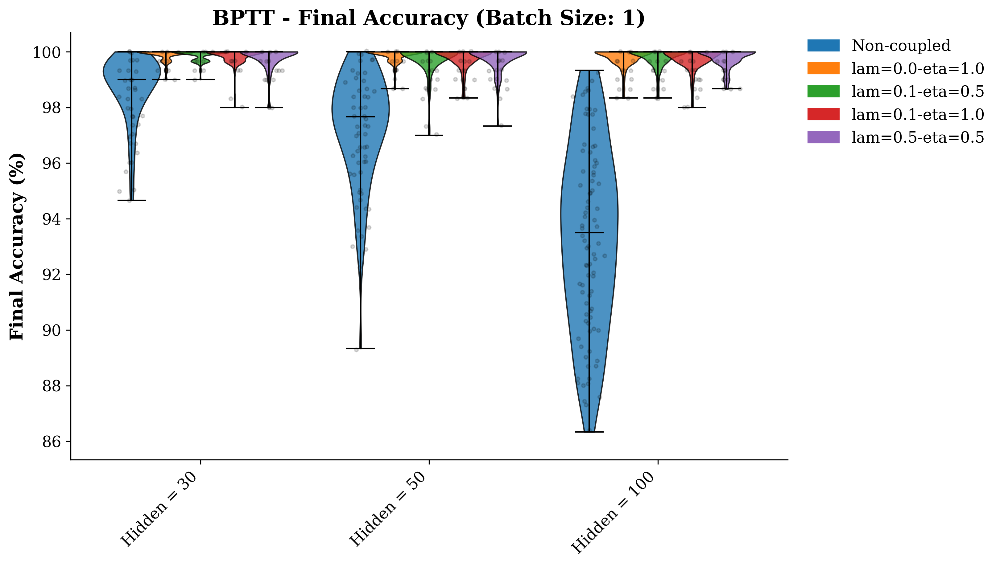

--- Plotting for batch_1 ---


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


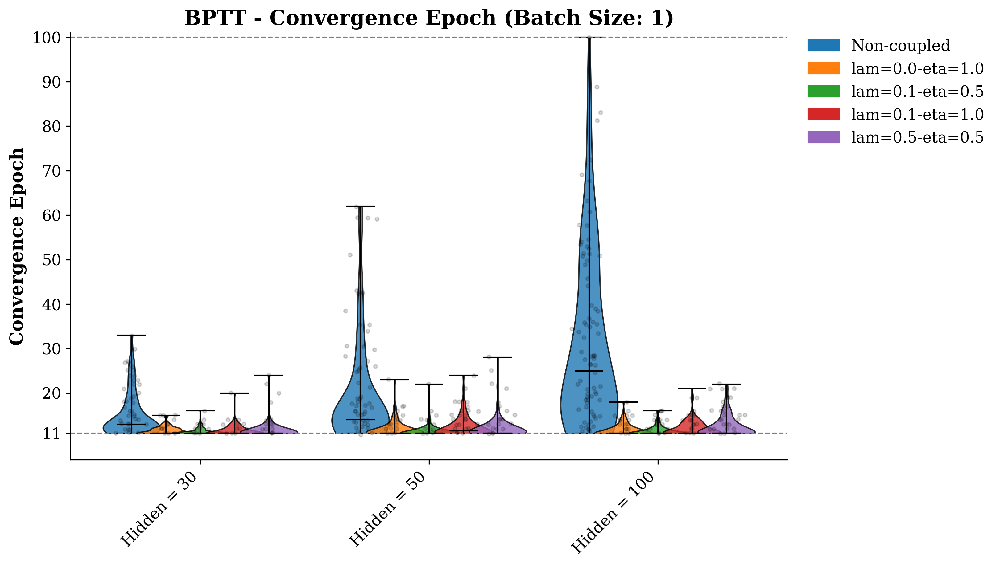

--- Plotting for batch_50 ---


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


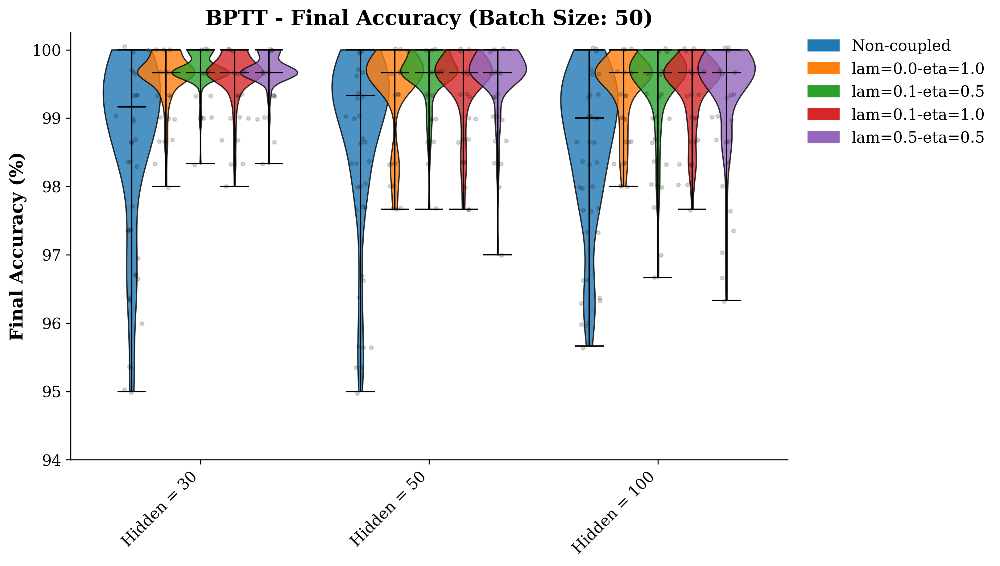

--- Plotting for batch_50 ---


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


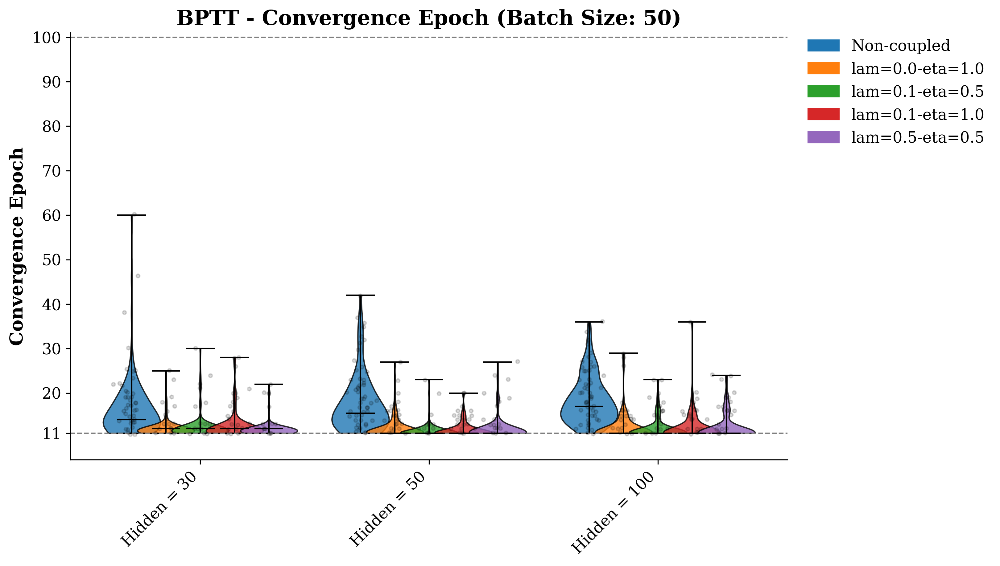

--- Plotting for batch_100 ---


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


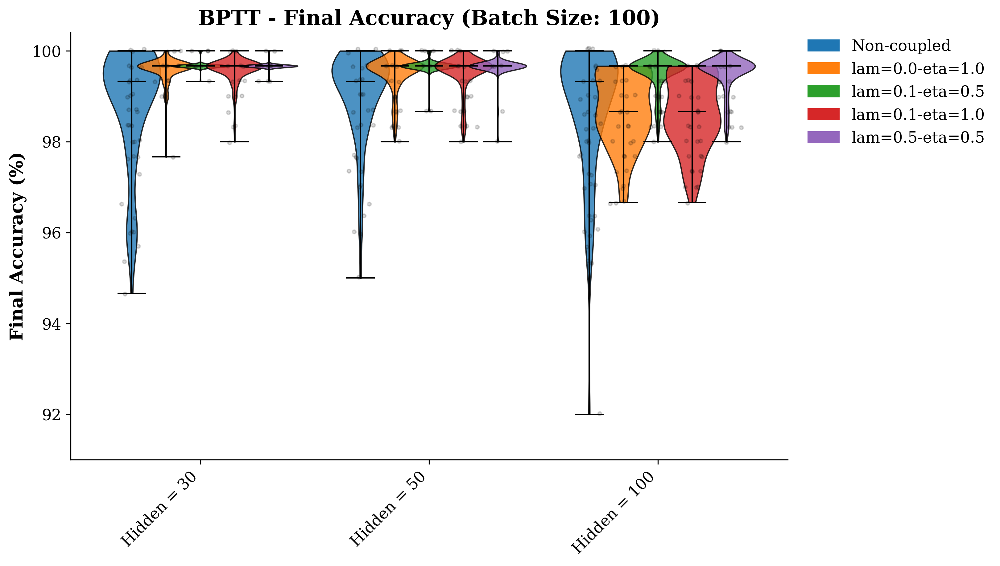

--- Plotting for batch_100 ---


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


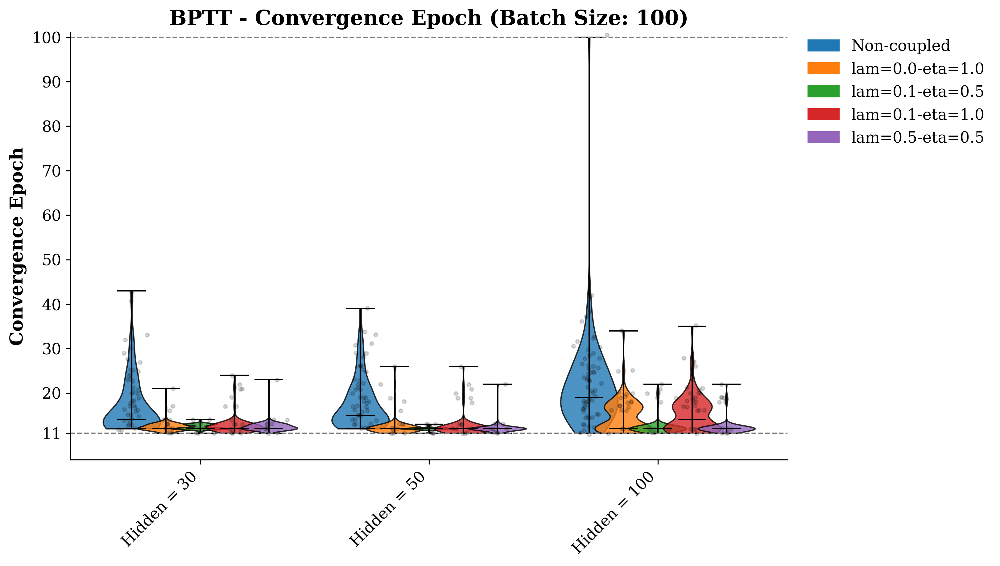

In [14]:
# Parameters for convergence detection and file paths
thresh_percent = 0.5
patience = 10
toy_bptt_dir = "./data/toy_bptt"
hidden_sizes = ["30", "50", "100"]
# Directory to save plots
save_directory = "plots/toy_bptt_plots/constant_batch_size"

# Gather BPTT data
bptt_acc, bptt_conv = gather_bptt_data(
    bptt_dir=toy_bptt_dir,
    hidden_sizes=hidden_sizes,
    threshold=thresh_percent,
    patience=patience
)

# Merge into combined dictionaries (here using only BPTT data)
combined_acc_data = {}
combined_acc_data.update(bptt_acc)
combined_conv_data = {}
combined_conv_data.update(bptt_conv)

# Define the batch sizes to plot (e.g., "batch_1", "batch_10", etc.)
batch_list = ["batch_1","batch_50", "batch_100"]


# For each batch size, create its own directory and produce plots
for batch in batch_list:
    # Create a directory for the current batch
    batch_dir = os.path.join(save_directory, batch)
    os.makedirs(batch_dir, exist_ok=True)
    
    # Extract numeric part from batch string (e.g., "1" from "batch_1")
    batch_numeric = batch.replace("batch_", "")
    
    # Plot Final Accuracy for the given batch across all hidden sizes
    plot_hidden_sizes_for_batch(
        combined_acc_data,
        batch_str=batch,
        y_label="Final Accuracy (%)",
        title=f"BPTT - Final Accuracy (Batch Size: {batch_numeric})",
        save_dir=batch_dir
    )
    
    plot_hidden_sizes_for_batch(
        combined_conv_data,
        batch_str=batch,
        y_label="Convergence Epoch",
        title=f"BPTT - Convergence Epoch (Batch Size: {batch_numeric})",
        save_dir=batch_dir
    )


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


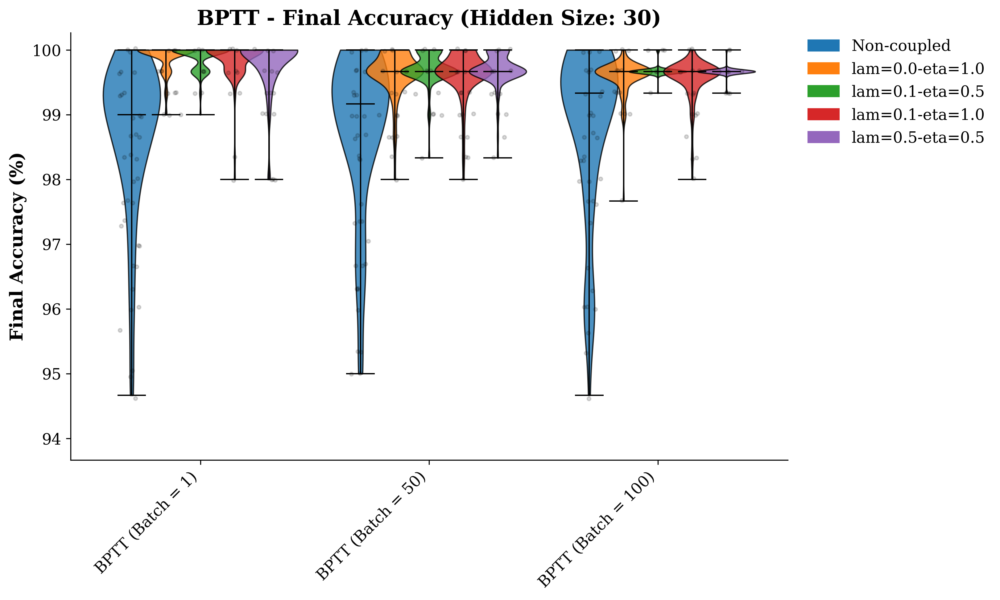

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


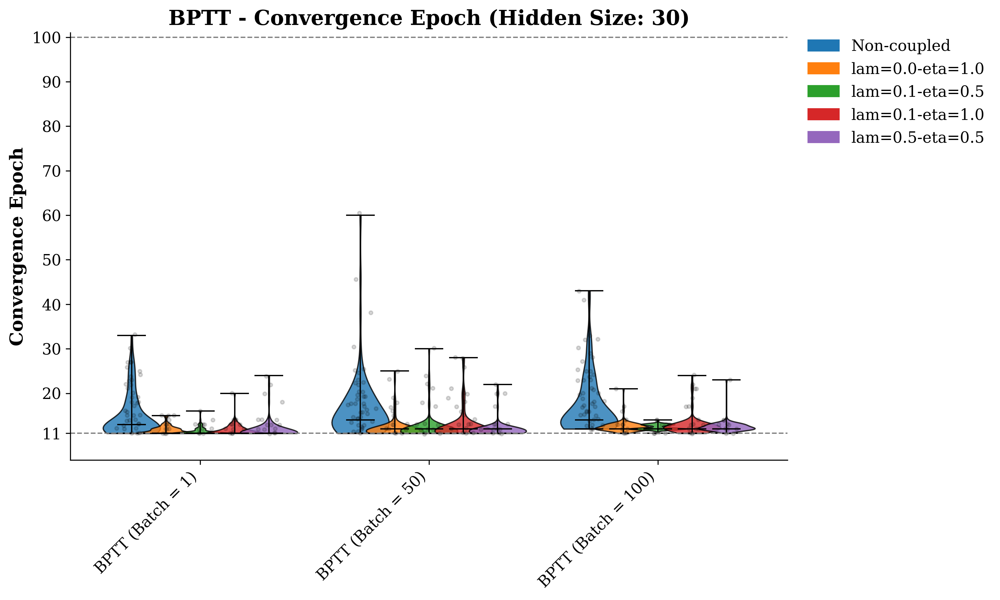

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


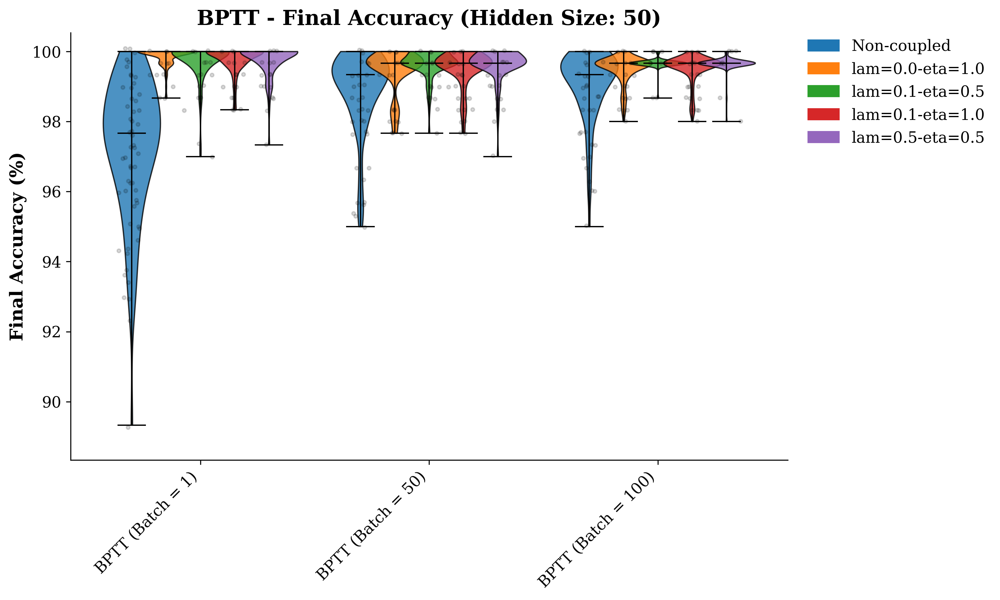

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


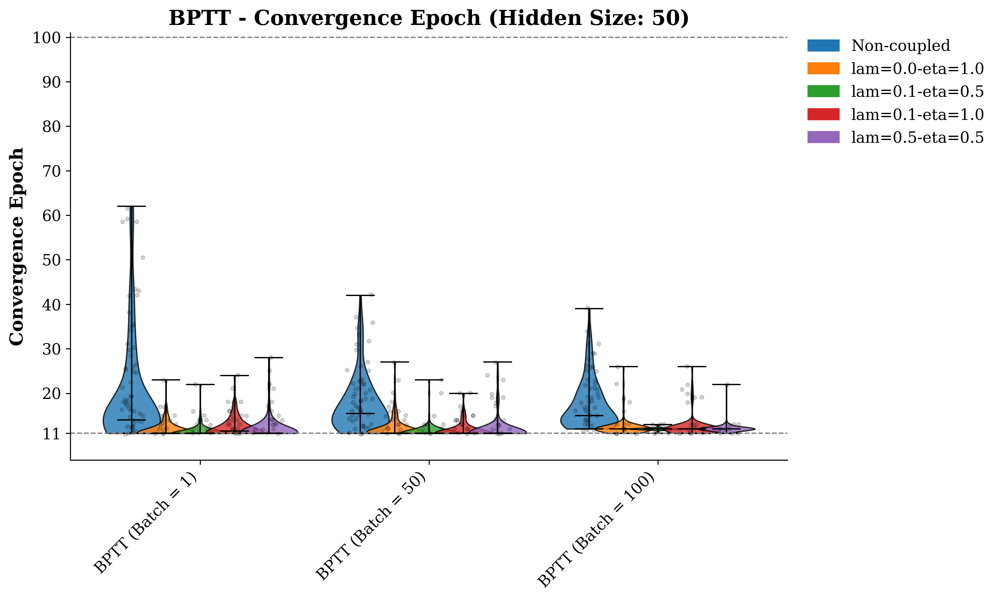

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


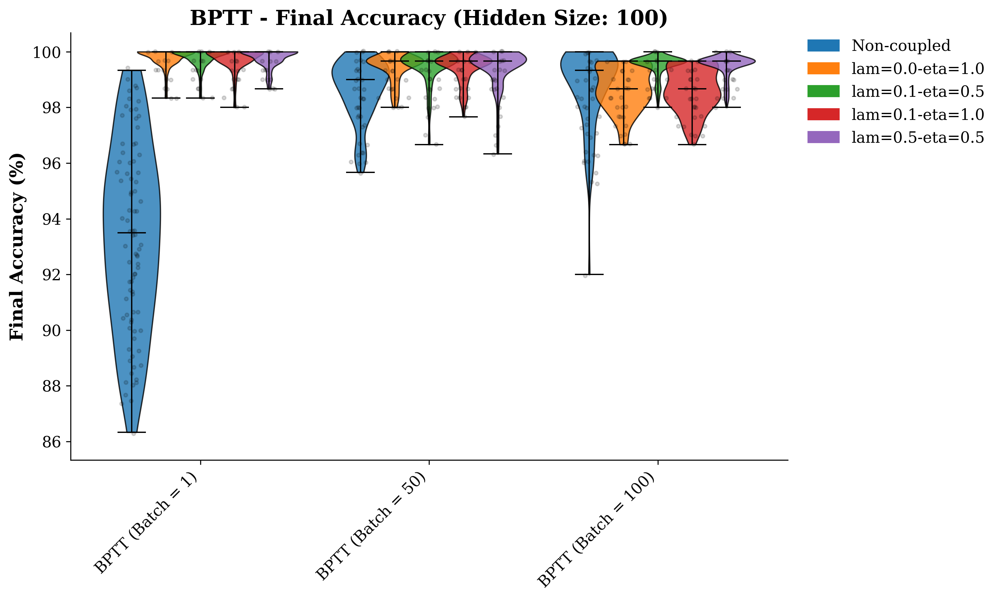

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


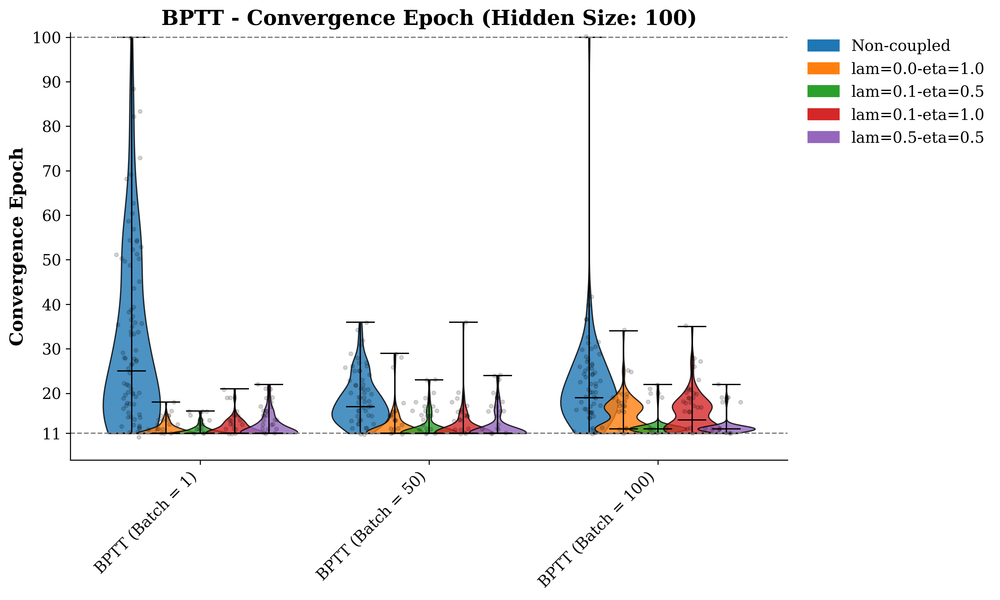

In [15]:
save_directory = "plots/toy_bptt_plots/constant_hidden_size"
batch_tuple = ("batch_1", "batch_50", "batch_100")

# For each hidden size, filter sub-data, then plot separately.
for hs in hidden_sizes:
    # Filter out groups matching the current hidden size (e.g. "H30_batch_1")
    sub_acc_data = {
        k: v for k, v in combined_acc_data.items()
        if f"H{hs}_" in k
        and any(allowed in k for allowed in batch_tuple)
    }
    sub_conv_data = {
        k: v for k, v in combined_conv_data.items()
        if f"H{hs}_" in k
        and any(allowed in k for allowed in batch_tuple)
    }

    
    # Create a separate directory for this hidden size
    hidden_dir = os.path.join(save_directory, f"Hidden_{hs}")
    os.makedirs(hidden_dir, exist_ok=True)
    
    # Plot Final Accuracy with updated academic labels and title
    plot_violin_comparison_all_models(
        sub_acc_data,
        y_label="Final Accuracy (%)",
        title=f"BPTT - Final Accuracy (Hidden Size: {hs})",
        save_dir=hidden_dir
    )
    
    # Plot Convergence Epoch with updated academic labels and title
    plot_violin_comparison_all_models(
        sub_conv_data,
        y_label="Convergence Epoch",
        title=f"BPTT - Convergence Epoch (Hidden Size: {hs})",
        save_dir=hidden_dir
    )


--- Plotting for batch_1 ---


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


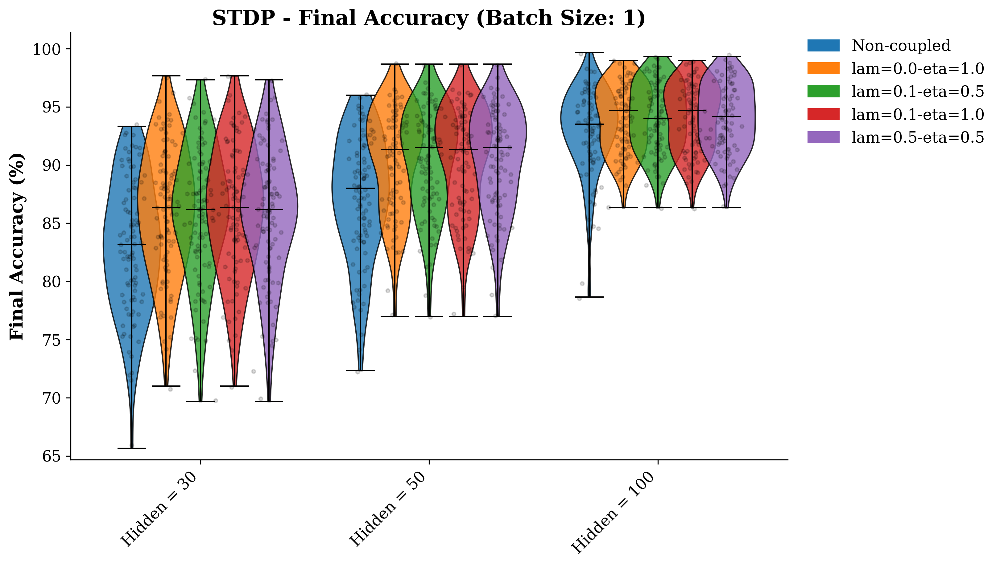

--- Plotting for batch_1 ---


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


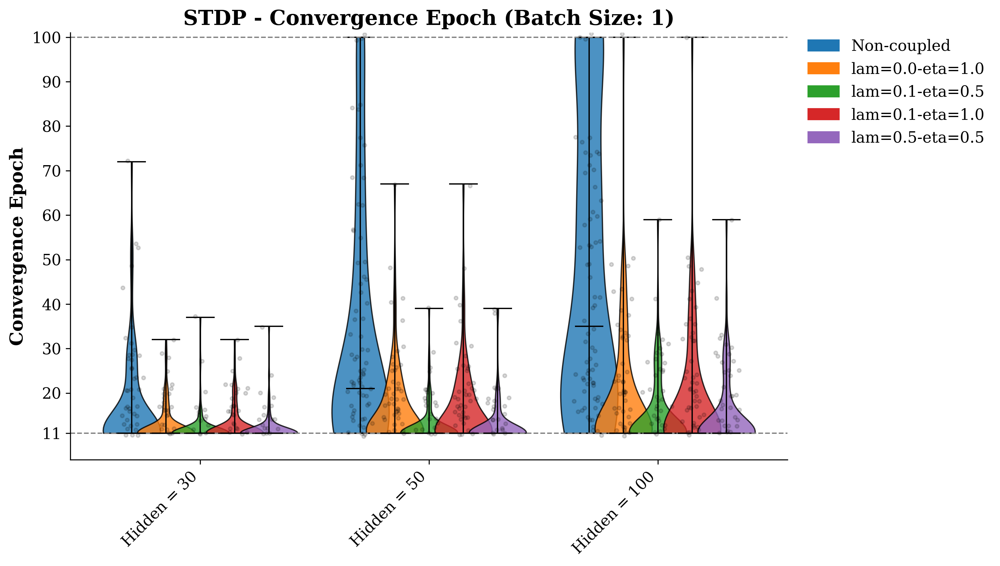

In [16]:
# Parameters for convergence detection and file paths
toy_stdp_dir = "./data/toy_stdp"
hidden_sizes = ["30", "50", "100"]
save_directory = "plots/toy_stdp_plots/stdp_constant_batch"

# Gather BPTT data
stdp_acc, stdp_conv = gather_bptt_data(
    bptt_dir=toy_stdp_dir,
    hidden_sizes=hidden_sizes,
    threshold=thresh_percent,
    patience=patience
)

# Merge into combined dictionaries (here using only BPTT data)
combined_acc_data = {}
combined_acc_data.update(stdp_acc)
combined_conv_data = {}
combined_conv_data.update(stdp_conv)

# Define the batch sizes to plot (e.g., "batch_1", "batch_10", etc.)
batch_list = ["batch_1"]

# For each batch size, create its own directory and produce plots
for batch in batch_list:
    # Create a directory for the current batch
    batch_dir = os.path.join(save_directory, batch)
    os.makedirs(batch_dir, exist_ok=True)
    
    # Extract numeric part from batch string (e.g., "1" from "batch_1")
    batch_numeric = batch.replace("batch_", "")
    
    # Plot Final Accuracy for the given batch across all hidden sizes
    plot_hidden_sizes_for_batch(
        combined_acc_data,
        batch_str=batch,
        y_label="Final Accuracy (%)",
        title=f"STDP - Final Accuracy (Batch Size: {batch_numeric})",
        save_dir=batch_dir
    )
    
    # Plot Convergence Epoch for the given batch across all hidden sizes
    plot_hidden_sizes_for_batch(
        combined_conv_data,
        batch_str=batch,
        y_label="Convergence Epoch",
        title=f"STDP - Convergence Epoch (Batch Size: {batch_numeric})",
        save_dir=batch_dir
    )


median speedup keys: [(30, 'batch_1'), (30, 'batch_100'), (30, 'batch_50'), (50, 'batch_1'), (50, 'batch_100'), (50, 'batch_50'), (100, 'batch_1'), (100, 'batch_100'), (100, 'batch_50'), (30, 'stdp'), (50, 'stdp'), (100, 'stdp')]
 mean speedup keys: [(30, 'batch_1'), (30, 'batch_100'), (30, 'batch_50'), (50, 'batch_1'), (50, 'batch_100'), (50, 'batch_50'), (100, 'batch_1'), (100, 'batch_100'), (100, 'batch_50'), (30, 'stdp'), (50, 'stdp'), (100, 'stdp')]
[30, 50, 100]
{(30, 'batch_1'): 15.384615957736969, (30, 'batch_100'): 14.28571492433548, (30, 'batch_50'): 14.28571492433548, (50, 'batch_1'): 21.42857164144516, (50, 'batch_100'): 20.000000298023224, (50, 'batch_50'): 29.032257199287415, (100, 'batch_1'): 56.00000023841858, (100, 'batch_100'): 36.84210479259491, (100, 'batch_50'): 35.29411852359772, (30, 'stdp'): 0.0, (50, 'stdp'): 47.61904776096344, (100, 'stdp'): 68.57143044471741}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


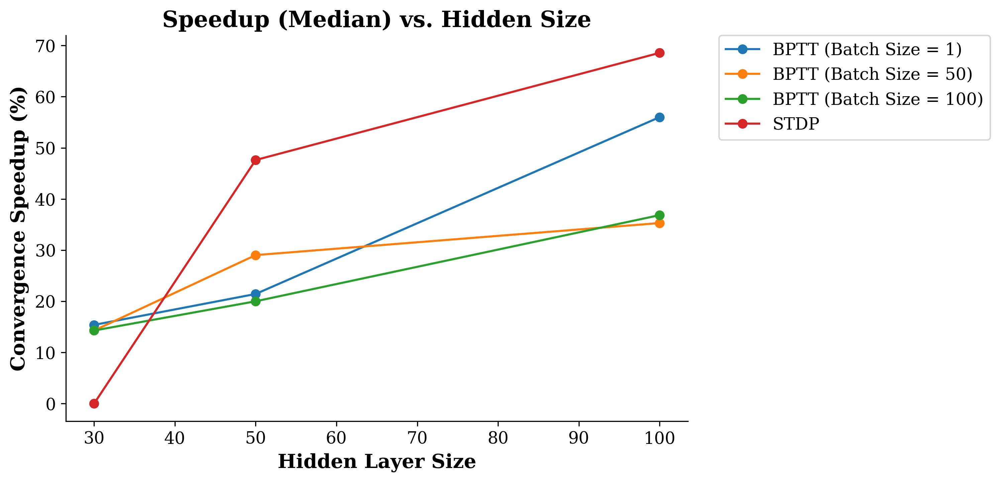

[30, 50, 100]
{(30, 'batch_1'): 20.404043793678284, (30, 'batch_100'): 26.658841967582703, (30, 'batch_50'): 26.965603232383728, (50, 'batch_1'): 37.244898080825806, (50, 'batch_100'): 30.8528870344162, (50, 'batch_50'): 30.817607045173645, (100, 'batch_1'): 59.00842547416687, (100, 'batch_100'): 42.08314120769501, (100, 'batch_50'): 32.482343912124634, (30, 'stdp'): 29.032257199287415, (50, 'stdp'): 60.469478368759155, (100, 'stdp'): 68.69858503341675}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


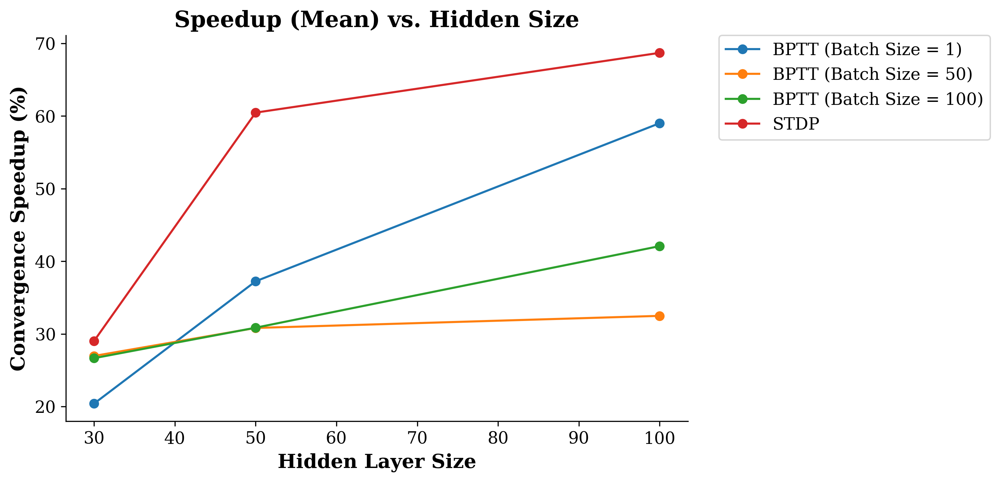

In [17]:
hidden_sizes = ["30", "50", "100"]
save_directory = "plots/toy_comparison_plots/"

# Combine the convergence data dictionaries
combined_conv_data = {}
combined_conv_data.update(bptt_conv)

# renaming so it would work with compute_speedup_by_hidden_size
stdp_conv = { f"STDP_{grp}": conds for grp,conds in stdp_conv.items() }
combined_conv_data.update(stdp_conv)


# Define experimental conditions for speedup calculation
baseline_cond = "lam=0.0-eta=0.0"
test_cond = "lam=0.5-eta=0.5"

# Compute speedup using the median
speedup_dict_median = compute_speedup_by_hidden_size(combined_conv_data,
                                                        baseline_cond=baseline_cond,
                                                        test_cond=test_cond,
                                                        use_mean=False, with_error=False)
# Compute speedup using the mean
speedup_dict_mean = compute_speedup_by_hidden_size(combined_conv_data,
                                                    baseline_cond=baseline_cond,
                                                    test_cond=test_cond,
                                                    use_mean=True, with_error=False)

print("median speedup keys:", list(speedup_dict_median.keys()))
print(" mean speedup keys:", list(speedup_dict_mean .keys()))

# Define the order of methods to plot
methods_order = ("batch_1",  "batch_50", "batch_100", "stdp")

# Plot and save the speedup curves
plot_speedup_lines(speedup_dict_median,
                    title="Speedup (Median) vs. Hidden Size",
                    save_dir=save_directory+"speedup_plots_median",
                    methods_order=methods_order, with_error=False)

plot_speedup_lines(speedup_dict_mean,
                    title="Speedup (Mean) vs. Hidden Size",
                    save_dir=save_directory+"speedup_plots_mean",
                    methods_order=methods_order, with_error=False)

[30, 50, 100]
{(30, 'batch_1'): (8.33333358168602, 8.33333358168602, 18.33333447575569), (30, 'batch_100'): (14.28571492433548, 14.28571492433548, 21.488094329833984), (30, 'batch_50'): (17.692308127880096, 10.000000149011612, 19.149796664714813), (50, 'batch_1'): (20.000000298023224, 12.445054948329926, 23.48370924592018), (50, 'batch_100'): (20.000000298023224, 7.362637110054493, 22.10526317358017), (50, 'batch_50'): (26.66666805744171, 18.33333447575569, 13.026314973831177), (100, 'batch_1'): (48.80952388048172, 33.42490792274475, 20.474664866924286), (100, 'batch_100'): (33.33333432674408, 13.333334028720856, 18.666663765907288), (100, 'batch_50'): (31.25, 15.865384042263031, 10.855263471603394), (30, 'stdp'): (0.0, 0.0, 36.996904760599136), (50, 'stdp'): (40.14705866575241, 40.14705866575241, 31.435096263885498), (100, 'stdp'): (61.00230515003204, 36.83563731610775, 20.882615447044373)}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


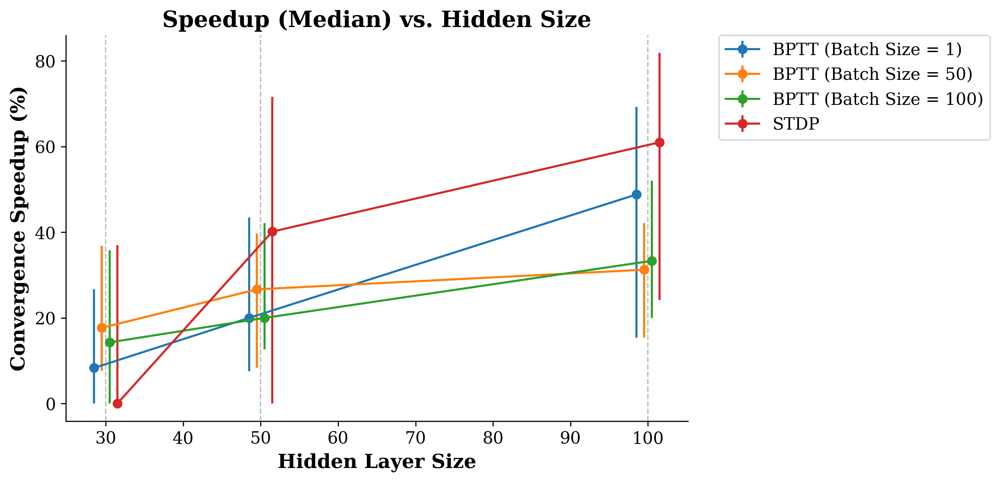

[30, 50, 100]
{(30, 'batch_1'): (15.266006082296371, 1.9385614599491028, 1.9385614599491028), (30, 'batch_100'): (19.207667268812656, 2.2975118839305697, 2.2975118839305697), (30, 'batch_50'): (19.429331310093403, 2.397766570850113, 2.397766570850113), (50, 'batch_1'): (22.4156332090497, 3.4177481606286806, 3.4177481606286806), (50, 'batch_100'): (25.021197631955147, 2.0338746805370547, 2.0338746805370547), (50, 'batch_50'): (23.59678526967764, 2.860319837332042, 2.860319837332042), (100, 'batch_1'): (42.626332338899374, 3.062474855864617, 3.062474855864617), (100, 'batch_100'): (34.60110707953572, 2.1616307654987144, 2.1616307654987144), (100, 'batch_50'): (27.641482464969158, 2.5552548264260895, 2.5552548264260895), (30, 'stdp'): (11.327440701425076, 4.134093662861075, 4.134093662861075), (50, 'stdp'): (34.66896411776543, 4.031298926129057, 4.031298926129057), (100, 'stdp'): (44.593983598053455, 6.248444161578032, 6.248444161578032)}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


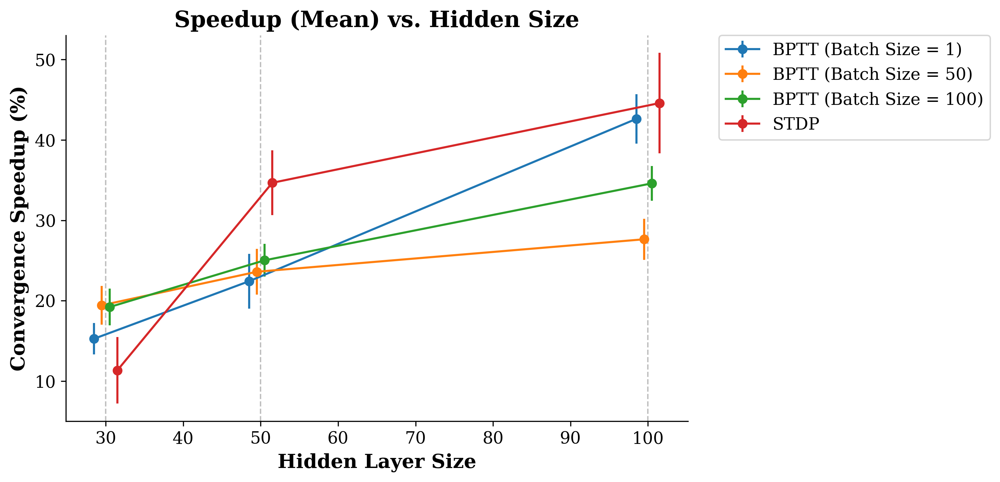

In [18]:
speedup_dict_median = compute_speedup_by_hidden_size(combined_conv_data,
                                                        baseline_cond=baseline_cond,
                                                        test_cond=test_cond,
                                                        use_mean=False, with_error=True)
# Compute speedup using the mean
speedup_dict_mean = compute_speedup_by_hidden_size(combined_conv_data,
                                                    baseline_cond=baseline_cond,
                                                    test_cond=test_cond,
                                                    use_mean=True, with_error=True)

plot_speedup_lines(speedup_dict_median,
                    title="Speedup (Median) vs. Hidden Size",
                    save_dir=save_directory+"speedup_plots_median_error",
                    methods_order=methods_order, with_error=True)

plot_speedup_lines(speedup_dict_mean,
                    title="Speedup (Mean) vs. Hidden Size",
                    save_dir=save_directory+"speedup_plots_mean_error",
                    methods_order=methods_order, with_error=True)